In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="1"

In [2]:
import numpy as np
import torch
import scanpy as sc
import muon as mu
import anndata
import mudata
import pandas as pd
import seaborn as sns

In [3]:
%load_ext autoreload
%autoreload 2

In [27]:
DATA_DIR = "/media/yob/nacho_stuff/prostate_cancer/Integration/MVAE-PoE/OtF-prostate/data/"
mdata = mu.read(DATA_DIR + "mdata_preprocessed_final_filtered.h5mu")
mdata

MuData object with n_obs × n_vars = 42475 × 31460
  obs:	'sample', 'tissue', 'patient', 'ann', 'imagerow', 'imagecol'
  2 modalities
    rna:	42475 x 18950
      obs:	'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes', 'size_factors', 'sample', 'type', 'patient', 'ann', 'tissue', 'imagerow', 'imagecol'
      obsm:	'spatial'
      layers:	'counts', 'scran_normalization', 'spotclean'
    msi:	42475 x 12510
      obs:	'ST_barcode', 'sample', 'tissue', 'patient', 'ann', 'imagerow', 'imagecol'
      obsm:	'spatial'

In [5]:
msi = mdata["msi"]
msi

AnnData object with n_obs × n_vars = 42475 × 12510
    obs: 'ST_barcode', 'sample', 'tissue', 'patient', 'ann', 'imagerow', 'imagecol'
    obsm: 'spatial'

# Without LISI loss (vanilla VAE)

In [6]:
from src.vae.model import VAE
from src.model import ModelParams

model_params = ModelParams(beta=0.01, n_layers=2, z_dim=100, n_hidden=300, use_cuda=True)

In [7]:
torch.set_num_threads(16)
model = VAE(msi, model_params)
model

VAE(
  (sampling): SamplingLayers(
    (mean): Sequential(
      (0): Linear(in_features=300, out_features=100, bias=True)
      (1): Dropout(p=0.3, inplace=False)
    )
    (logvar): Sequential(
      (0): Linear(in_features=300, out_features=100, bias=True)
      (1): Dropout(p=0.3, inplace=False)
    )
  )
  (encoder): FullyConnectedLayers(
    (layers): Sequential(
      (0): Sequential(
        (0): Linear(in_features=12510, out_features=300, bias=True)
        (1): BatchNorm1d(300, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): Dropout(p=0.1, inplace=False)
      )
      (1): Sequential(
        (0): Linear(in_features=300, out_features=300, bias=True)
        (1): BatchNorm1d(300, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): Dropout(p=0.1, inplace=False)
      )
    )
  )
  (decoder): FullyConnectedLayers(
    (layers): Sequential(
      (0): Sequential(
        (0): Linear(in

In [8]:
from src.train import TrainParams
train_params = TrainParams(train_size=0.8, n_epochs=100, learning_rate=1e-4, batch_size=128)

In [9]:
from src.vae.train import train_vae

In [15]:
hist = train_vae(model, msi, train_params)

/media/gambino/students_workdir/anna/OtF-prostate/src/vae/dataloader.py:49: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[BATCH_KEY] = pd.Categorical(
/media/gambino/students_workdir/anna/OtF-prostate/src/vae/dataloader.py:49: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[BATCH_KEY] = pd.Categorical(
100%|█████████████████████████████████████████| 266/266 [00:14<00:00, 17.83it/s]

EarlyStopping (epoch: 1): train loss improved to 0.003227523694570237



100%|███████████████████████████████████████████| 67/67 [00:05<00:00, 13.12it/s]

EarlyStopping (epoch: 1): valid loss improved to 0.3922595234949197



100%|███████████████████████████████████████████| 67/67 [00:04<00:00, 14.44it/s]

EarlyStopping (epoch: 2): valid loss improved to 0.39225442907703456



100%|███████████████████████████████████████████| 67/67 [00:05<00:00, 12.48it/s]

EarlyStopping (epoch: 3): valid loss improved to 0.3877704165764709



100%|█████████████████████████████████████████| 266/266 [00:15<00:00, 17.68it/s]

EarlyStopping (epoch: 21): train loss hasn't improved: 0.0032461966062869094. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:14<00:00, 18.43it/s]

EarlyStopping (epoch: 22): train loss hasn't improved: 0.0032433132605387085. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:14<00:00, 18.06it/s]

EarlyStopping (epoch: 23): train loss hasn't improved: 0.003246595988103823. Stopping.



100%|███████████████████████████████████████████| 67/67 [00:04<00:00, 13.82it/s]

EarlyStopping (epoch: 23): valid loss hasn't improved: 0.39277943212594557. Stopping.


In [17]:
from src.vae.train import to_latent
emb = to_latent(model, msi, train_params)

100%|█████████████████████████████████████████| 332/332 [00:13<00:00, 24.24it/s]


In [18]:
from src.vae.train import predict
x = predict(model, msi, train_params)

100%|█████████████████████████████████████████| 332/332 [00:13<00:00, 24.06it/s]


In [19]:
msi.layers['x'] = np.vstack(x)

emb = [x.numpy() for x in emb]
emb = np.vstack(emb)

msi.obsm['z'] = emb

In [20]:
sc.pp.neighbors(msi, use_rep='z', n_neighbors=10)
sc.tl.umap(msi)
msi.obsm['X_mvae'] = msi.obsm['X_umap']

In [21]:
sc.tl.leiden(msi, resolution=0.8, key_added='r0.8')

/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


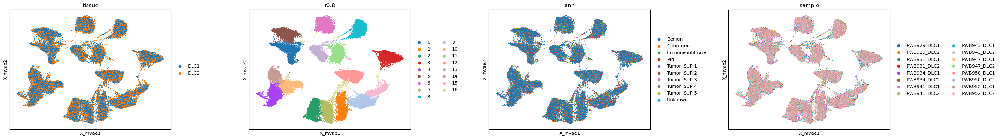

In [23]:
sc.pl.embedding(msi, 'X_mvae', color=['tissue', 'r0.8', 'ann', 'sample'], size=15, wspace=0.35)

# With LISI loss

In [5]:
from src.types import TrainParams
lisi_params = TrainParams(train_size=0.8, n_epochs=100, learning_rate=1e-4, batch_size=128, params_file="vae_lisi")

In [28]:
from src.vae.model import VAE
from src.model import ModelParams

model_params = ModelParams(beta=0.01, n_layers=2, z_dim=100, n_hidden=300, use_cuda=True)
torch.set_num_threads(16)
msi = mdata["msi"].copy()
model = VAE(msi, model_params)
model

VAE(
  (sampling): SamplingLayers(
    (mean): Sequential(
      (0): Linear(in_features=300, out_features=100, bias=True)
      (1): Dropout(p=0.3, inplace=False)
    )
    (logvar): Sequential(
      (0): Linear(in_features=300, out_features=100, bias=True)
      (1): Dropout(p=0.3, inplace=False)
    )
  )
  (encoder): FullyConnectedLayers(
    (layers): Sequential(
      (0): Sequential(
        (0): Linear(in_features=12510, out_features=300, bias=True)
        (1): BatchNorm1d(300, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): Dropout(p=0.1, inplace=False)
      )
      (1): Sequential(
        (0): Linear(in_features=300, out_features=300, bias=True)
        (1): BatchNorm1d(300, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): Dropout(p=0.1, inplace=False)
      )
    )
  )
  (decoder): FullyConnectedLayers(
    (layers): Sequential(
      (0): Sequential(
        (0): Linear(in

In [14]:
msi

AnnData object with n_obs × n_vars = 42475 × 12510
    obs: 'ST_barcode', 'sample', 'tissue', 'patient', 'ann', 'imagerow', 'imagecol'
    obsm: 'spatial'

In [30]:
from src.vae.train import train_vae
hist = train_vae(model, msi, lisi_params)

/media/gambino/students_workdir/anna/OtF-prostate/src/vae/dataloader.py:49: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[BATCH_KEY] = pd.Categorical(
/media/gambino/students_workdir/anna/OtF-prostate/src/vae/dataloader.py:49: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[BATCH_KEY] = pd.Categorical(
100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.10it/s]

EarlyStopping (epoch: 1): train loss improved to 0.005691970134918096



100%|███████████████████████████████████████████| 67/67 [00:27<00:00,  2.40it/s]

EarlyStopping (epoch: 1): valid loss improved to 0.7011034889007682



100%|█████████████████████████████████████████| 266/266 [02:07<00:00,  2.09it/s]

EarlyStopping (epoch: 2): train loss improved to 0.005430626862185222



100%|███████████████████████████████████████████| 67/67 [00:27<00:00,  2.41it/s]

EarlyStopping (epoch: 2): valid loss improved to 0.6791206242433235



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.10it/s]

EarlyStopping (epoch: 3): train loss improved to 0.005316605806140215



100%|███████████████████████████████████████████| 67/67 [00:27<00:00,  2.43it/s]

EarlyStopping (epoch: 3): valid loss improved to 0.6718188666585666



100%|█████████████████████████████████████████| 266/266 [02:07<00:00,  2.09it/s]

EarlyStopping (epoch: 4): train loss improved to 0.005231201722384762



100%|███████████████████████████████████████████| 67/67 [00:27<00:00,  2.42it/s]

EarlyStopping (epoch: 4): valid loss improved to 0.6636896658299575



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.10it/s]

EarlyStopping (epoch: 5): train loss improved to 0.005191828414859176



100%|███████████████████████████████████████████| 67/67 [00:28<00:00,  2.38it/s]

EarlyStopping (epoch: 5): valid loss improved to 0.6525180402086742



100%|█████████████████████████████████████████| 266/266 [02:07<00:00,  2.09it/s]

EarlyStopping (epoch: 6): train loss improved to 0.005139957555186545



100%|███████████████████████████████████████████| 67/67 [00:28<00:00,  2.39it/s]

EarlyStopping (epoch: 6): valid loss improved to 0.6467799944664115



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.10it/s]

EarlyStopping (epoch: 7): train loss improved to 0.005107806473005653



100%|███████████████████████████████████████████| 67/67 [00:28<00:00,  2.36it/s]

EarlyStopping (epoch: 7): valid loss improved to 0.6376046903097807



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.10it/s]

EarlyStopping (epoch: 8): train loss improved to 0.005087265326669456



100%|███████████████████████████████████████████| 67/67 [00:28<00:00,  2.37it/s]

EarlyStopping (epoch: 8): valid loss improved to 0.6367572065609605



100%|█████████████████████████████████████████| 266/266 [02:07<00:00,  2.09it/s]

EarlyStopping (epoch: 9): train loss improved to 0.0050408837495655645



100%|███████████████████████████████████████████| 67/67 [00:27<00:00,  2.42it/s]

EarlyStopping (epoch: 9): valid loss improved to 0.6353469072882809



100%|█████████████████████████████████████████| 266/266 [02:07<00:00,  2.08it/s]

EarlyStopping (epoch: 10): train loss improved to 0.005030642245502034



100%|███████████████████████████████████████████| 67/67 [00:27<00:00,  2.44it/s]

EarlyStopping (epoch: 10): valid loss improved to 0.6320819650123368



100%|█████████████████████████████████████████| 266/266 [02:07<00:00,  2.08it/s]

EarlyStopping (epoch: 11): train loss improved to 0.005013805850594797



100%|███████████████████████████████████████████| 67/67 [00:28<00:00,  2.38it/s]

EarlyStopping (epoch: 11): valid loss improved to 0.6277910470962524



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.10it/s]

EarlyStopping (epoch: 12): train loss improved to 0.005003451494134967



100%|███████████████████████████████████████████| 67/67 [00:28<00:00,  2.38it/s]

EarlyStopping (epoch: 12): valid loss improved to 0.625187280462749



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.10it/s]

EarlyStopping (epoch: 13): train loss improved to 0.004993647322926962



100%|█████████████████████████████████████████| 266/266 [02:05<00:00,  2.11it/s]

EarlyStopping (epoch: 14): train loss improved to 0.00497670510258655



100%|███████████████████████████████████████████| 67/67 [00:27<00:00,  2.42it/s]

EarlyStopping (epoch: 14): valid loss improved to 0.6240344963856598



100%|█████████████████████████████████████████| 266/266 [02:05<00:00,  2.11it/s]

EarlyStopping (epoch: 15): train loss improved to 0.004963259894473192



100%|███████████████████████████████████████████| 67/67 [00:28<00:00,  2.37it/s]

EarlyStopping (epoch: 15): valid loss improved to 0.6218477300743559



100%|█████████████████████████████████████████| 266/266 [02:07<00:00,  2.09it/s]

EarlyStopping (epoch: 16): train loss improved to 0.004954078665475693



100%|███████████████████████████████████████████| 67/67 [00:28<00:00,  2.39it/s]

EarlyStopping (epoch: 16): valid loss improved to 0.6206448763164122



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.11it/s]

EarlyStopping (epoch: 17): train loss improved to 0.004945460135548026



100%|███████████████████████████████████████████| 67/67 [00:27<00:00,  2.41it/s]

EarlyStopping (epoch: 18): valid loss improved to 0.6168653030893696



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.11it/s]

EarlyStopping (epoch: 19): train loss improved to 0.004939308432777746



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.10it/s]

EarlyStopping (epoch: 20): train loss improved to 0.0049213958109316225



100%|███████████████████████████████████████████| 67/67 [00:27<00:00,  2.45it/s]

EarlyStopping (epoch: 20): valid loss improved to 0.616638909524946



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.10it/s]

EarlyStopping (epoch: 21): train loss improved to 0.004916541930013997



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.10it/s]

EarlyStopping (epoch: 22): train loss improved to 0.004912990547405263



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.10it/s]

EarlyStopping (epoch: 23): train loss improved to 0.004907284367428309



100%|███████████████████████████████████████████| 67/67 [00:27<00:00,  2.40it/s]

EarlyStopping (epoch: 23): valid loss improved to 0.6144765197341122



100%|███████████████████████████████████████████| 67/67 [00:27<00:00,  2.41it/s]

EarlyStopping (epoch: 26): valid loss improved to 0.6134891216434649



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.10it/s]

EarlyStopping (epoch: 27): train loss improved to 0.004905392360238204



100%|███████████████████████████████████████████| 67/67 [00:27<00:00,  2.41it/s]

EarlyStopping (epoch: 27): valid loss improved to 0.6133214190824708



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.10it/s]

EarlyStopping (epoch: 28): train loss improved to 0.004895137959960771



100%|███████████████████████████████████████████| 67/67 [00:27<00:00,  2.41it/s]

EarlyStopping (epoch: 28): valid loss improved to 0.6126704287173143



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.10it/s]

EarlyStopping (epoch: 29): train loss improved to 0.004883914229938603



100%|███████████████████████████████████████████| 67/67 [00:27<00:00,  2.45it/s]

EarlyStopping (epoch: 29): valid loss improved to 0.6121646770790442



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.10it/s]

EarlyStopping (epoch: 32): train loss improved to 0.004881522108555682



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.10it/s]

EarlyStopping (epoch: 33): train loss improved to 0.004872904099598571



100%|███████████████████████████████████████████| 67/67 [00:27<00:00,  2.40it/s]

EarlyStopping (epoch: 34): valid loss improved to 0.6107322858340705



100%|███████████████████████████████████████████| 67/67 [00:27<00:00,  2.40it/s]

EarlyStopping (epoch: 35): valid loss improved to 0.6085303203383489



100%|█████████████████████████████████████████| 266/266 [02:07<00:00,  2.09it/s]

EarlyStopping (epoch: 38): train loss improved to 0.0048707296754978485



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.10it/s]

EarlyStopping (epoch: 40): train loss improved to 0.00487008056548008



100%|███████████████████████████████████████████| 67/67 [00:28<00:00,  2.38it/s]

EarlyStopping (epoch: 41): valid loss improved to 0.6056520218279824



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.10it/s]

EarlyStopping (epoch: 44): train loss improved to 0.004863276004159781



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.10it/s]

EarlyStopping (epoch: 49): train loss improved to 0.004854714486302875



100%|█████████████████████████████████████████| 266/266 [02:07<00:00,  2.09it/s]

EarlyStopping (epoch: 61): train loss improved to 0.004853610805794378



100%|███████████████████████████████████████████| 67/67 [00:27<00:00,  2.42it/s]

EarlyStopping (epoch: 61): valid loss improved to 0.6052233656840538



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.11it/s]

EarlyStopping (epoch: 62): train loss improved to 0.0048533279678974525



100%|█████████████████████████████████████████| 266/266 [02:07<00:00,  2.08it/s]

EarlyStopping (epoch: 63): train loss improved to 0.004844495697958881



100%|███████████████████████████████████████████| 67/67 [00:27<00:00,  2.41it/s]

EarlyStopping (epoch: 71): valid loss improved to 0.6022968692566032



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.10it/s]

EarlyStopping (epoch: 75): train loss improved to 0.004842729870889943



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.10it/s]

EarlyStopping (epoch: 78): train loss improved to 0.00483415818445959



100%|█████████████████████████████████████████| 266/266 [02:12<00:00,  2.00it/s]

EarlyStopping (epoch: 83): train loss improved to 0.004833339315221337



100%|███████████████████████████████████████████| 67/67 [00:27<00:00,  2.43it/s]

EarlyStopping (epoch: 87): valid loss improved to 0.602160477816169



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.10it/s]

EarlyStopping (epoch: 88): train loss improved to 0.004829223998649602



100%|███████████████████████████████████████████| 67/67 [00:27<00:00,  2.43it/s]

EarlyStopping (epoch: 90): valid loss improved to 0.6011226853327964



100%|█████████████████████████████████████████| 266/266 [02:05<00:00,  2.12it/s]

EarlyStopping (epoch: 92): train loss improved to 0.00482829579400483



100%|█████████████████████████████████████████| 266/266 [02:06<00:00,  2.10it/s]

EarlyStopping (epoch: 93): train loss improved to 0.00481990114810398



100%|███████████████████████████████████████████| 67/67 [00:27<00:00,  2.41it/s]

EarlyStopping (epoch: 96): valid loss improved to 0.5988405284596913



100%|███████████████████████████████████████████| 67/67 [00:27<00:00,  2.40it/s]


In [31]:
from src.vae.train import to_latent
emb = to_latent(model, msi, lisi_params)

100%|█████████████████████████████████████████| 332/332 [00:14<00:00, 22.29it/s]


In [32]:
from src.vae.train import predict
x = predict(model, msi, lisi_params)

100%|█████████████████████████████████████████| 332/332 [00:14<00:00, 22.24it/s]


In [33]:
msi.layers['x'] = np.vstack(x)

emb = [x.numpy() for x in emb]
emb = np.vstack(emb)

msi.obsm['z'] = emb

sc.pp.neighbors(msi, use_rep='z', n_neighbors=10)
sc.tl.umap(msi)
msi.obsm['X_mvae'] = msi.obsm['X_umap']

In [34]:
sc.tl.leiden(msi, resolution=0.8, key_added='r0.8')

/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


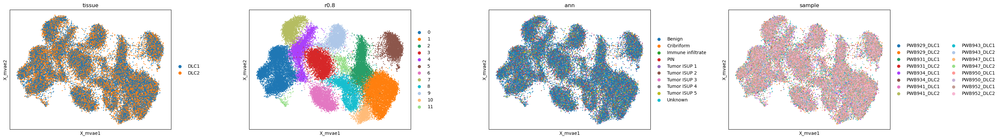

In [35]:
sc.pl.embedding(msi, 'X_mvae', color=['tissue', 'r0.8', 'ann', 'sample'], size=15, wspace=0.35)

# Diagnostics

## Without LISI loss

In [179]:
model_dict = torch.load('mvae_params/vae_params_no_lisi_20230319-171734.pt', map_location='cuda')
model_no_lisi = VAE(mdata["msi"].copy(), model_params)
model_no_lisi.load_state_dict(model_dict)

<All keys matched successfully>

In [185]:
train_params = TrainParams(train_size=0.8, n_epochs=100, learning_rate=1e-4, batch_size=128)

# Random Forest classification
classification_performance(model_no_lisi, mdata["msi"].copy(), train_params)

100%|█████████████████████████████████████████| 332/332 [00:16<00:00, 19.95it/s]


0.4205607476635514

In [186]:
# LISI (value ~= by how many batches a single point is surrounded on average)
batch_integration(model_no_lisi, mdata["msi"].copy(), train_params)

100%|█████████████████████████████████████████| 332/332 [00:15<00:00, 21.28it/s]


tensor(7.4724, device='cuda:0')

## With LISI loss

In [157]:
from src.vae.diagnostics import classification_performance, batch_integration

classification_performance(model, msi, lisi_params)

0.4294784904045088

In [178]:
batch_integration(model, msi, lisi_params)

100%|█████████████████████████████████████████| 332/332 [00:20<00:00, 15.83it/s]


tensor(7.3512, device='cuda:0')

In [151]:
predicted_ann = rfc_z_shared_ann.predict(msi.obsm["X_mvae"])
msi.obs["predicted_ann"] = predicted_ann 
msi.obs["predicted_ann"] = msi.obs["predicted_ann"].astype("category")

/tmp/ipykernel_347053/2917508111.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.add_categories(total_categories - subset_ann_cat)


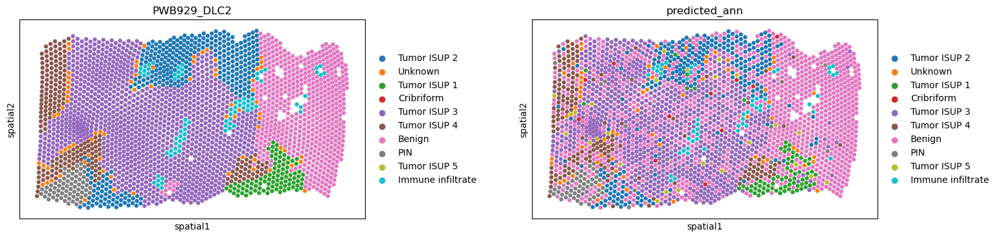

/tmp/ipykernel_347053/2917508111.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.add_categories(total_categories - subset_ann_cat)


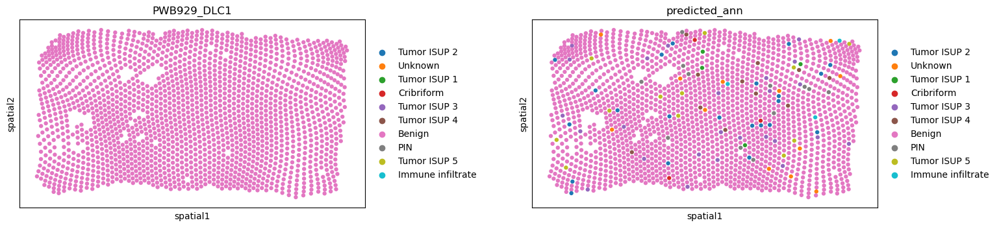

/tmp/ipykernel_347053/2917508111.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.add_categories(total_categories - subset_ann_cat)


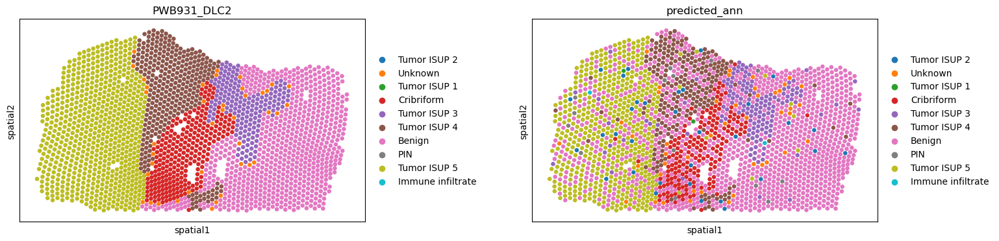

/tmp/ipykernel_347053/2917508111.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.add_categories(total_categories - subset_ann_cat)


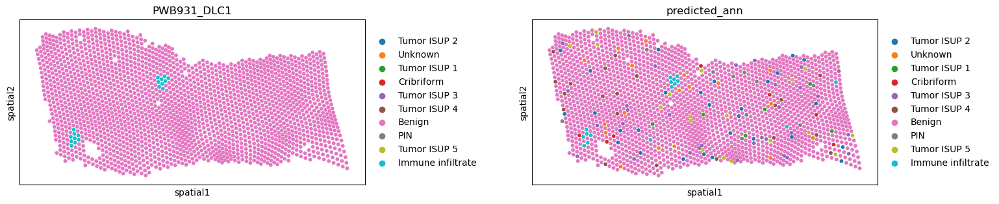

/tmp/ipykernel_347053/2917508111.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.add_categories(total_categories - subset_ann_cat)


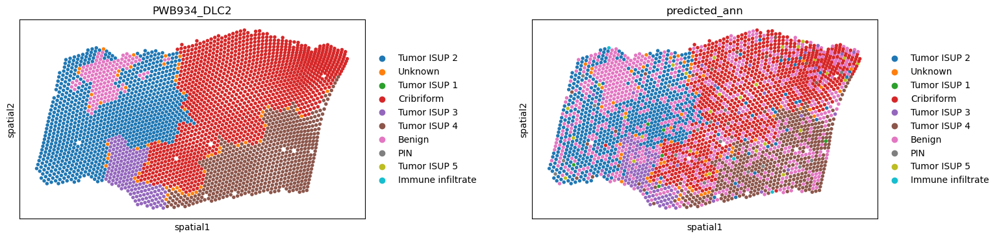

/tmp/ipykernel_347053/2917508111.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.add_categories(total_categories - subset_ann_cat)


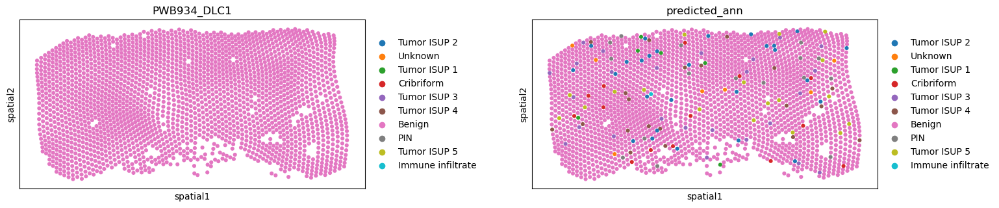

/tmp/ipykernel_347053/2917508111.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.add_categories(total_categories - subset_ann_cat)


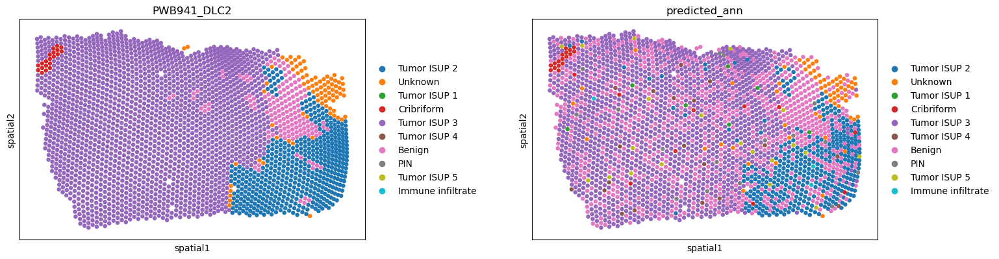

/tmp/ipykernel_347053/2917508111.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.add_categories(total_categories - subset_ann_cat)


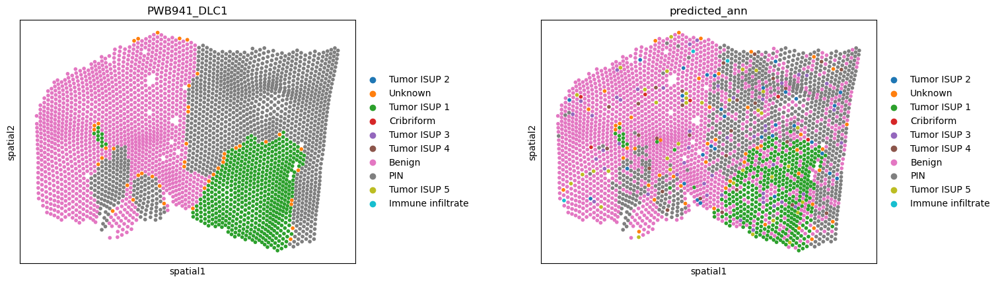

/tmp/ipykernel_347053/2917508111.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.add_categories(total_categories - subset_ann_cat)


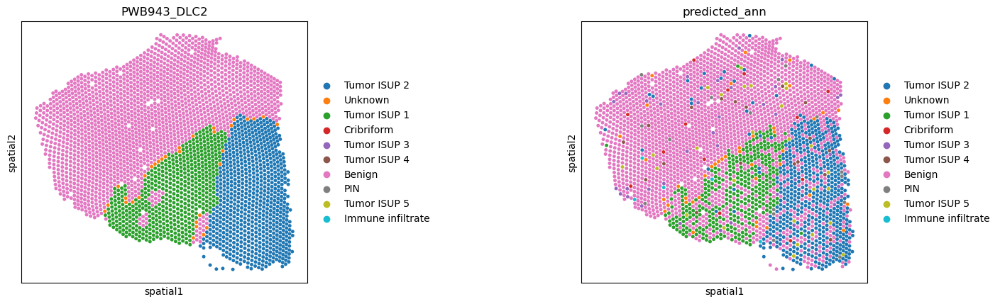

/tmp/ipykernel_347053/2917508111.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.add_categories(total_categories - subset_ann_cat)


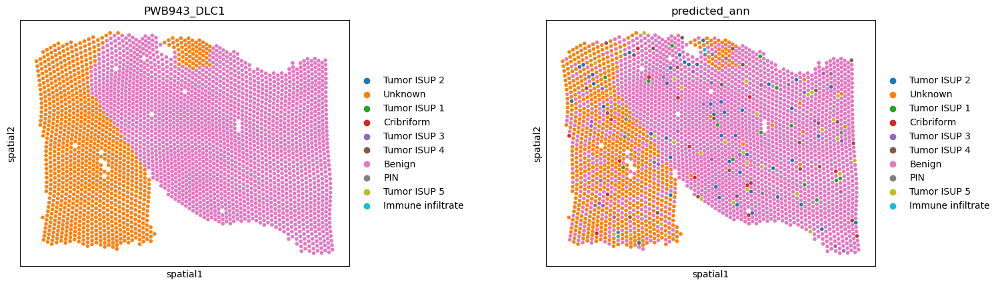

/tmp/ipykernel_347053/2917508111.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.add_categories(total_categories - subset_ann_cat)


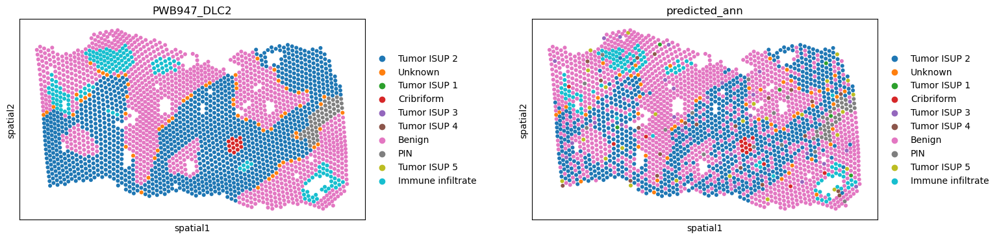

/tmp/ipykernel_347053/2917508111.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.add_categories(total_categories - subset_ann_cat)


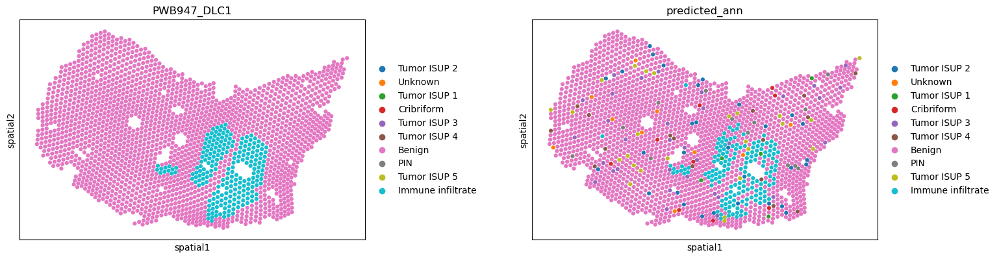

/tmp/ipykernel_347053/2917508111.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.add_categories(total_categories - subset_ann_cat)


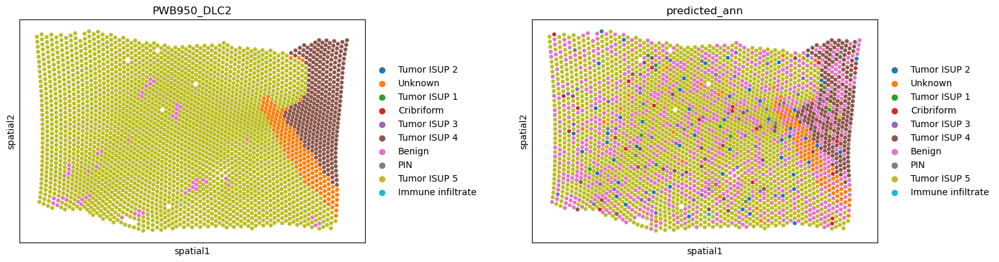

/tmp/ipykernel_347053/2917508111.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.add_categories(total_categories - subset_ann_cat)


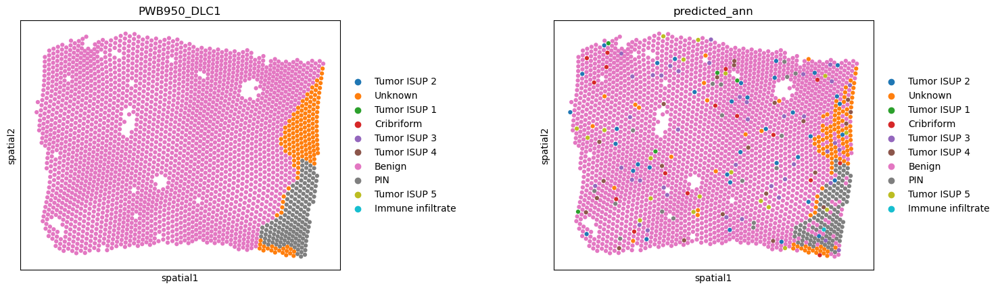

/tmp/ipykernel_347053/2917508111.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.add_categories(total_categories - subset_ann_cat)


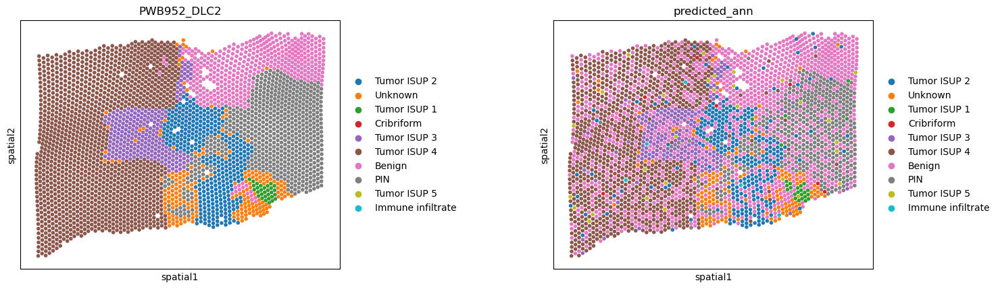

/tmp/ipykernel_347053/2917508111.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.add_categories(total_categories - subset_ann_cat)


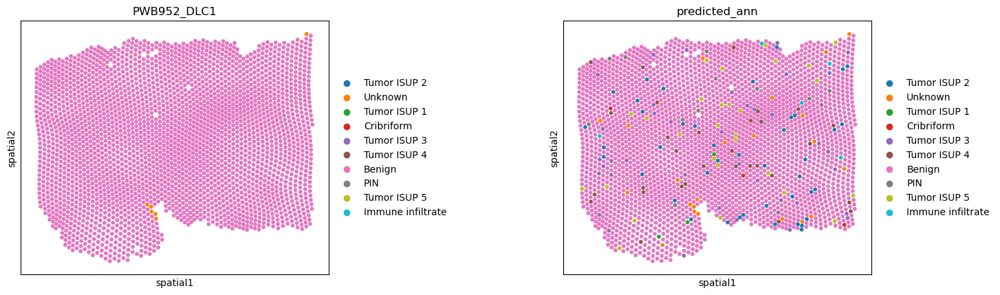

In [154]:
total_categories = set(msi.obs["ann"].cat.categories)

for i, s in enumerate(msi.obs.loc[:,'sample'].unique()):
    mdata_tmp = msi[msi.obs.loc[:,'sample']==s]
    subset_ann_cat = set(mdata_tmp.obs["ann"].cat.categories)
    mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.add_categories(total_categories - subset_ann_cat)
    mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.reorder_categories(total_categories)
    
    subset_predicted_cat = set(mdata_tmp.obs["predicted_ann"].cat.categories)
    mdata_tmp.obs["predicted_ann"] = mdata_tmp.obs["predicted_ann"].cat.add_categories(total_categories - subset_predicted_cat)
    mdata_tmp.obs["predicted_ann"] = mdata_tmp.obs["predicted_ann"].cat.reorder_categories(total_categories)
    
    sc.pl.spatial(mdata_tmp, color=["ann", "predicted_ann"], spot_size=3, title=s, wspace=0.35)
